In [6]:
import matplotlib.pyplot as plt
import numpy as np
from librosa.feature import chroma_stft
from pprint import pprint
import librosa
import json
from IPython.display import display, Audio

In [7]:
def musical_key(chromagram, mode='major'):
    # use chromograms and short time fourier transform
    chroma_matrix = np.matrix(chromagram).T
    path = f"key_profiles/{mode}.json"

    with open(path) as f:
        scales = json.load(f)
        similarities = {}
        for key in scales:
            profile = np.matrix(scales[key]).T
            score = np.mean(chroma_matrix * profile)
            similarities[key] = score

    sorted_similarties = sorted(similarities.items(), key=lambda x: x[1])
    sorted_array = np.array(sorted_similarties)

    notes  = sorted_array[:, 0]
    scores = sorted_array[:, 1].astype(float)

    plt.bar(notes, scores)
    plt.title(f"Similarity Scores for {mode.capitalize()} Scales")
    plt.xlabel(f"{mode.capitalize()} Scales")
    plt.ylabel("Score")

    return max(similarities.items(), key=lambda item: item[1])

Key: ('D', 2.26568988906086)


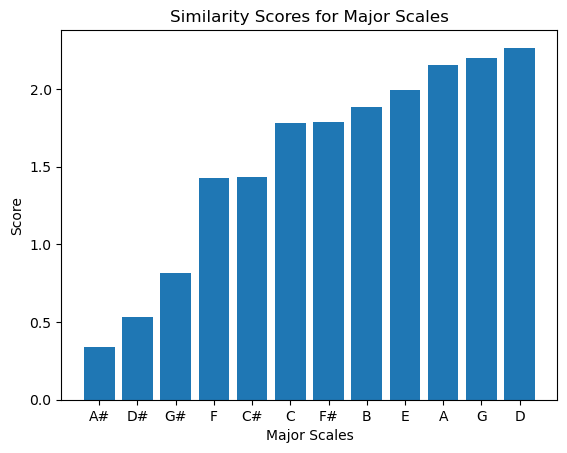

In [12]:
y, sr = librosa.load("wav_songs/Satie - Gymnopédie No 1 Modified.wav")
chromagram = chroma_stft(y=y, sr=sr)
mode = 'major'
key_value = musical_key(chromagram, mode='major')
print(f'Key: {key_value}')
key = f'{key_value[0]}:{mode}'

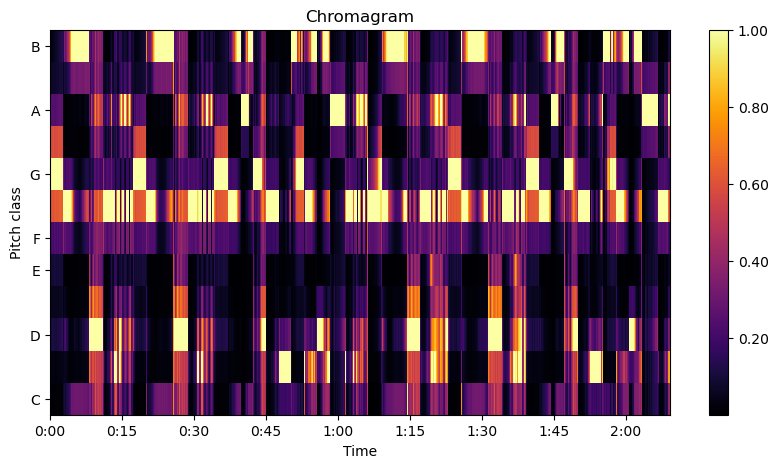

In [11]:
# Visualize the chromagram (optional)
display(Audio('wav_songs/Satie - Gymnopédie No 1 Modified.wav'))
plt.figure(figsize=(10, 5))
librosa.display.specshow(chromagram, x_axis="time", y_axis="chroma", 
                         cmap="inferno", hop_length=1536, key=key)
plt.title("Chromagram")
plt.colorbar(format="%.2f")
plt.show()